In [1]:
library(tidyverse)
library(XML)
library(reshape2)
library(ggplot2)
library(plyr)
library(forecast)
library(forecastHybrid)
library(thief)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.3     ✔ purrr   0.3.4
✔ tibble  3.1.1     ✔ dplyr   1.0.5
✔ tidyr   1.1.3     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths


------------------------------------------------------------------------------

You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)

------------------------------------------------------------------------------


Attaching package: ‘plyr’


The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize


Th

# Задание 1  
Построить демографический прогноз изменения численности постоянного населения одного из субъектов Российской Федерации до 2030 года - в нашем случае Новгородская область

**Этап 1** - подготовка данных. На этом этапе мы составляем сводную таблицу для годов с 2009-2020, мужского и женского пола и возраста 1-100.

In [2]:
#write your's years numbers
years <- c("2009","2010","2012","2013","2014","2015","2016","2017","2018","2019","2020");
table <- data.frame();
for( i in years ){
  if(i  == "2012"){
    st <- ncol(table) - 1;
    sf <- ncol(table) ;
    t <- table[,st:sf];
    names(t) = c("m2011","f2011");
    table<- cbind(table,t);
  }
  #write your directory files
  namer <- paste0("../input/population/" , i ,"r.csv")
  name <- paste0("../input/population/" , i ,".csv");
  table1 <- read.table(name,sep = ",");
  table2 <- read.table(namer,sep = ",");
  #contants depends on table structure, hope works everywhere
  extr <- table1[10:121,c(2,4:5)];
  extr1 <- table2[8:128,c(2,5,6)]
  t3 <- extr[-grep("*--*", extr[,1]),]
  t4 <- extr1[-grep("*--*",extr1[,1]),];
  t3[,2] <- as.numeric(as.character(t3[,2]));
  t3[,3] <- as.numeric(as.character(t3[,3]));
  t4[,2] <- as.numeric(as.character(t4[,2]));
  t4[,3] <- as.numeric(as.character(t4[,3]));
#  sum <- table1[grep("Итого|Все население", table1[,2]),];
#  sum1 <- table2[grep("Итого|Все население", table2[,2]),];
  summ <- t3[81,2]+t3[82,2];
  sumf <- t3[81,3]+t3[82,3];
  summ1 <- sum(t4[81:101,2]);
  sumf1 <- sum(t4[81:101,3]);
  name1 <- paste0("m",i);
  name2 <- paste0("f",i);
  t4[81:101,2] <- round(t4[81:101,2]*summ/summ1);
  t4[81:101,3] <- round(t4[81:101,3]*sumf/sumf1);
  t3 <- t3[1:80,]
  names(t3) <- c("a",name1,name2);
  names(t4) <- c("a",name1,name2);
  t3 <- rbind(t3,t4[81:101,]);
  if (ncol(table) ==0){
    table <- t3;
  }
  else{
    table<- cbind(table,t3[,2:3]);
  }
}

Результирующая таблица для годов 2009-2020. Так как данные для 2011 года отсутствуют, мы считаем что данные для 2011 года повторяют данные 2010 года. Также отсутствовали данные по годам для возрастов от 80,имели только данные по 5-летним группам,эти данные для региона были эстраполированы из данных по России

In [3]:
table
write.table(table,"./MainTable");

,a,m2009,f2009,m2010,f2010,m2011,f2011,m2012,f2012,m2013,⋯,m2016,f2016,m2017,f2017,m2018,f2018,m2019,f2019,m2020,f2020
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
10,0,3534,3303,3713,3411,3713,3411,3669,3391,3840,⋯,3843,3469,3733,3451,3205,3014,3031,2778,2744,2433
11,1,3583,3345,3525,3288,3525,3288,3526,3314,3666,⋯,3818,3576,3838,3469,3729,3440,3196,3007,3035,2772
12,2,3298,3064,3580,3341,3580,3341,3600,3255,3552,⋯,3776,3574,3812,3571,3829,3431,3705,3430,3208,3009
14,3,3273,2893,3295,3055,3295,3055,3510,3251,3598,⋯,3851,3705,3770,3568,3795,3573,3792,3421,3694,3431
15,4,3254,3106,3257,2890,3257,2890,3486,3238,3513,⋯,3688,3406,3854,3708,3758,3552,3788,3567,3784,3418
17,5,3233,3009,3248,3101,3248,3101,3206,2971,3495,⋯,3569,3330,3695,3396,3837,3687,3766,3534,3783,3570
19,6,3064,2937,3229,3001,3229,3001,3152,2830,3212,⋯,3591,3253,3548,3354,3665,3384,3811,3675,3761,3548
21,7,2792,2665,3058,2933,3058,2933,3103,2999,3158,⋯,3527,3245,3599,3265,3530,3335,3653,3375,3808,3664
22,8,2705,2515,2793,2668,2793,2668,3133,2893,3087,⋯,3493,3276,3528,3249,3590,3232,3527,3336,3663,3368


**Этап 2** - Прогнозирование населения к 2035 году
Для прогнозирования использовалась гибридная модель временных рядов - среднее значение прогнозов интегрированной модели авторегрессии,модели экспоненциального сглаживания, тета метод прогнозирования, метод экспоненциального сглаживания для пространственно временных рядов с помощью преоброазования Бокса-Кокса, а также трендовыми и сезонными компонентами

In [4]:
#Расширение таблицы для прогноза
for (i in 2021:2030){
  st <- ncol(table) - 1;
  sf <- ncol(table) ;
  t <- table[,st:sf];
  names(t) = c(paste0("m",i),paste0("f",i));
  table<- cbind(table,t);
}

In [5]:
#Пронгнозирование
for(i in 1:100){
  h <- ts(t(table[i,seq(2,25,2)]),
          frequency = 1,
          start = 2009);
  #ggtsdisplay(h)
  quickModel <- hybridModel(h,models = c("a","e","f","z","t") );
  qq <- forecast(quickModel)
  #plot(qq, main = "Forecast from auto.arima, ets, thetam,  and tbats model")
  #plot(quickModel, type = "fit", ggplot = TRUE)
  table[i,seq(26,ncol(table),2)] <- round(qq$mean[1:10]) 
}

for(i in 1:100){
  h <- ts(t(table[i,seq(3,25,2)]),
          frequency = 1,
          start = 2009);
  #ggtsdisplay(h)
  quickModel <- hybridModel(h,models = c("a","e","f","z","t"));
  qq <- forecast(quickModel)
  #plot(qq, main = "Forecast from auto.arima, ets, thetam, nnetar, stlm, and tbats model")
  #plot(quickModel, type = "fit", ggplot = TRUE)
  table[i,seq(27,ncol(table),2)] <- round(qq$mean[1:10]) 
}


Fitting the auto.arima model

Fitting the ets model

Fitting the thetam model

Fitting the tbats model

Fitting the snaive model

Fitting the auto.arima model

Fitting the ets model

Fitting the thetam model

Fitting the tbats model

Fitting the snaive model

Fitting the auto.arima model

Fitting the ets model

Fitting the thetam model

Fitting the tbats model

Fitting the snaive model

Fitting the auto.arima model

Fitting the ets model

Fitting the thetam model

Fitting the tbats model

Fitting the snaive model

Fitting the auto.arima model

Fitting the ets model

Fitting the thetam model

Fitting the tbats model

Fitting the snaive model

Fitting the auto.arima model

Fitting the ets model

Fitting the thetam model

Fitting the tbats model

Fitting the snaive model

Fitting the auto.arima model

Fitting the ets model

Fitting the thetam model

Fitting the tbats model

Fitting the snaive model

Fitting the auto.arima model

Fitting the ets model

Fitting the thetam model

Fitting the

Общая поло-возрастная таблица населения Новгородской области, включающее и спрогнозирванные года. 

In [7]:
table

,a,m2009,f2009,m2010,f2010,m2011,f2011,m2012,f2012,m2013,⋯,m2026,f2026,m2027,f2027,m2028,f2028,m2029,f2029,m2030,f2030
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
10,0,3534,3303,3713,3411,3713,3411,3669,3391,3840,⋯,2347,2022,2283,1956,2220,1889,2156,1822,2092,1755
11,1,3583,3345,3525,3288,3525,3288,3526,3314,3666,⋯,3136,2823,3134,2826,3132,2827,3130,2828,3128,2828
12,2,3298,3064,3580,3341,3580,3341,3600,3255,3552,⋯,3558,3162,3559,3163,3560,3164,3562,3166,3563,3167
14,3,3273,2893,3295,3055,3295,3055,3510,3251,3598,⋯,3749,3482,3756,3490,3764,3497,3771,3504,3778,3510
15,4,3254,3106,3257,2890,3257,2890,3486,3238,3513,⋯,3889,3584,3903,3602,3917,3620,3931,3638,3945,3656
17,5,3233,3009,3248,3101,3248,3101,3206,2971,3495,⋯,3913,3683,3932,3700,3951,3718,3970,3736,3988,3754
19,6,3064,2937,3229,3001,3229,3001,3152,2830,3212,⋯,4054,3677,4100,3698,4146,3719,4192,3740,4238,3761
21,7,2792,2665,3058,2933,3058,2933,3103,2999,3158,⋯,4164,3922,4224,3976,4284,4030,4344,4084,4404,4137
22,8,2705,2515,2793,2668,2793,2668,3133,2893,3087,⋯,4074,3725,4137,3780,4200,3834,4263,3889,4326,3943


**Этап 3**  Визуализация полученных результатов

Графики прогнзов для всех годов и полов. Можно увидеть, что по нашему прогнозу рождаемость населения к 2030 году уменьшится у 2 раза по сранению с 2009

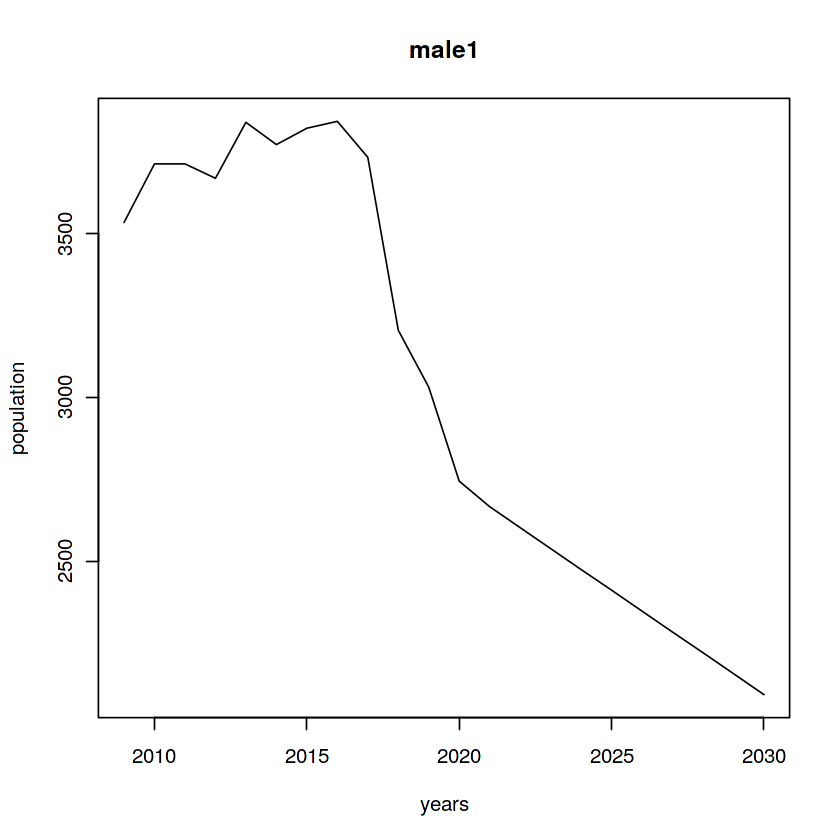

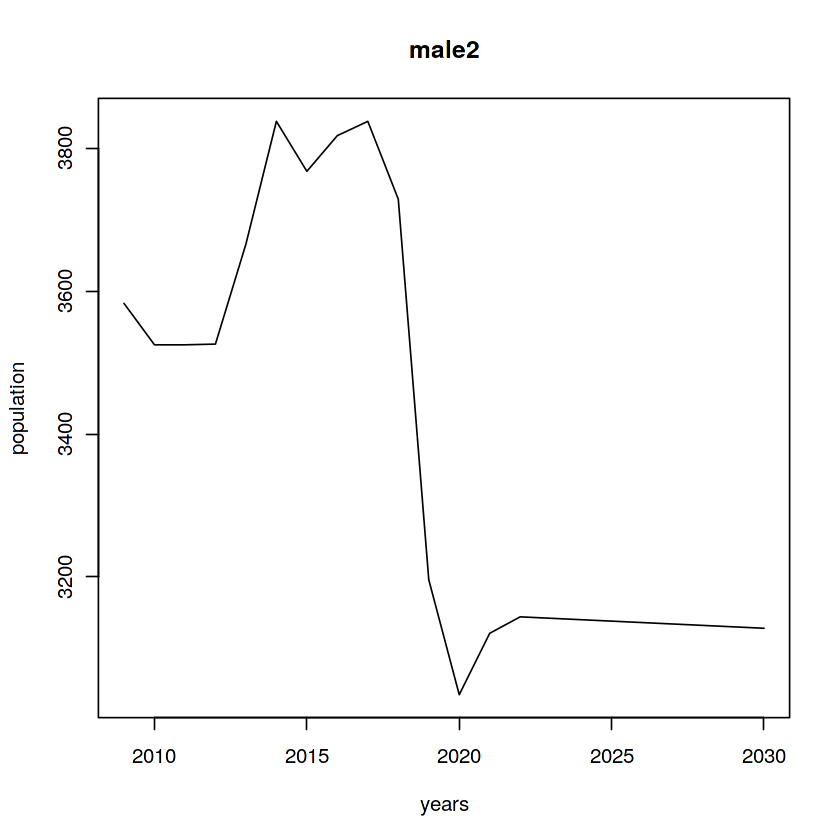

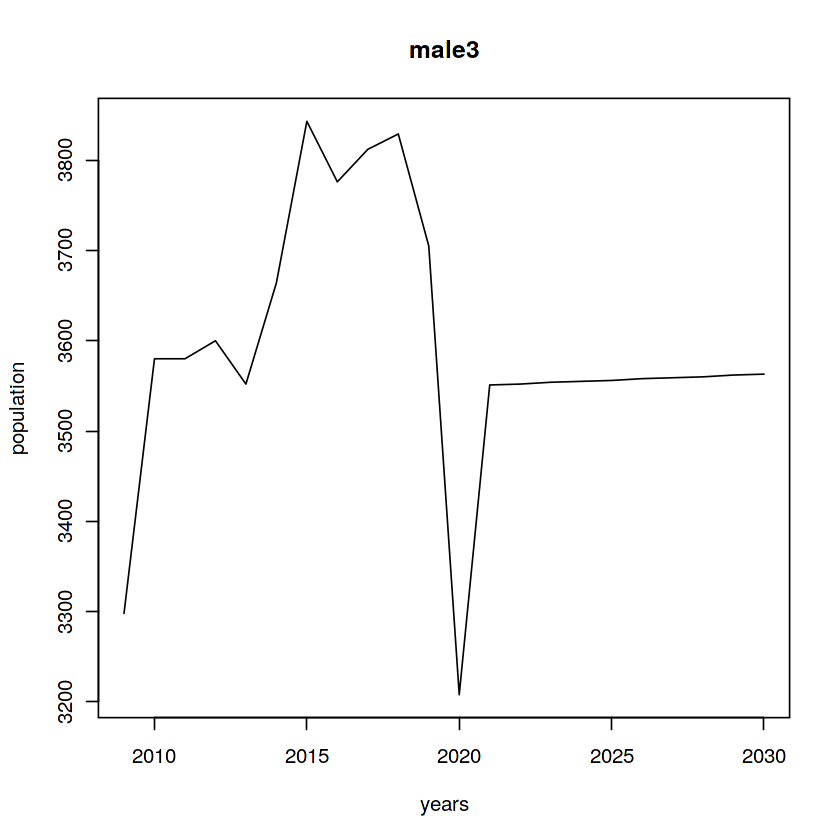

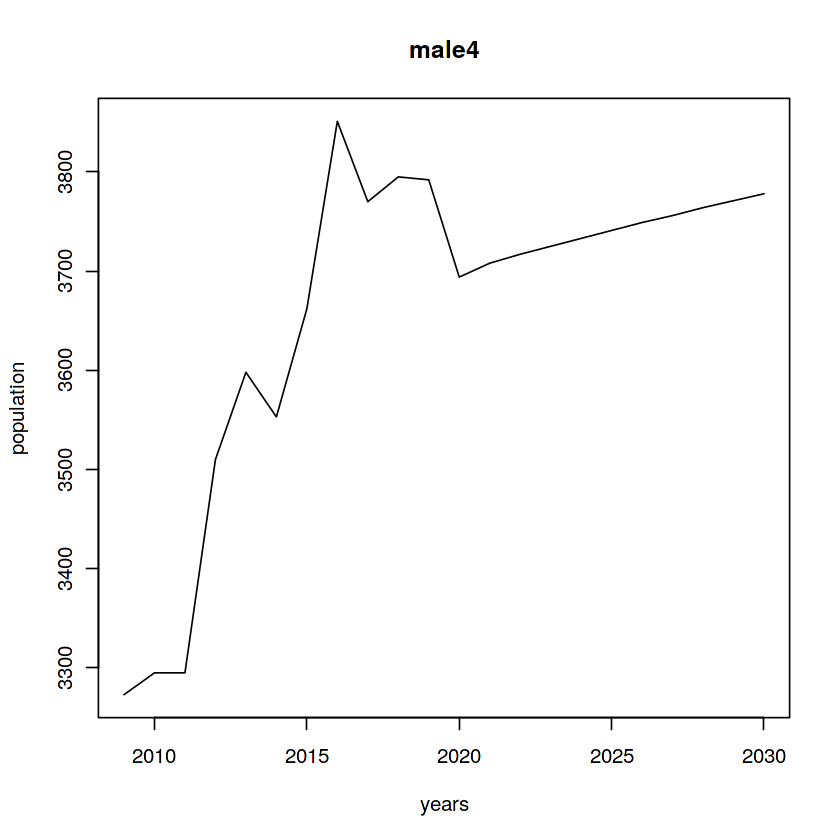

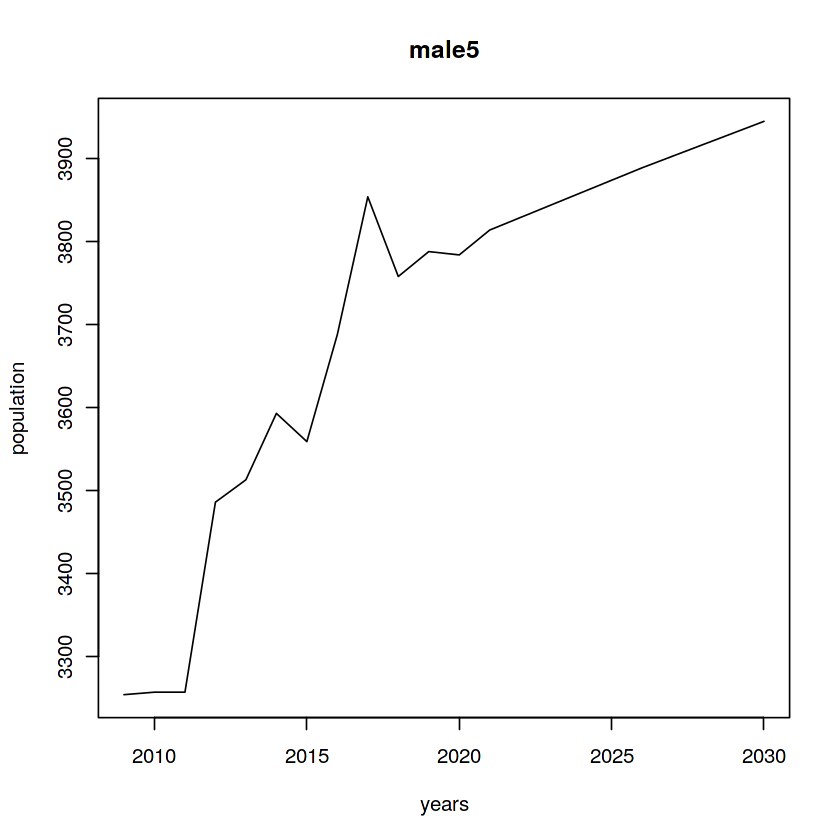

...

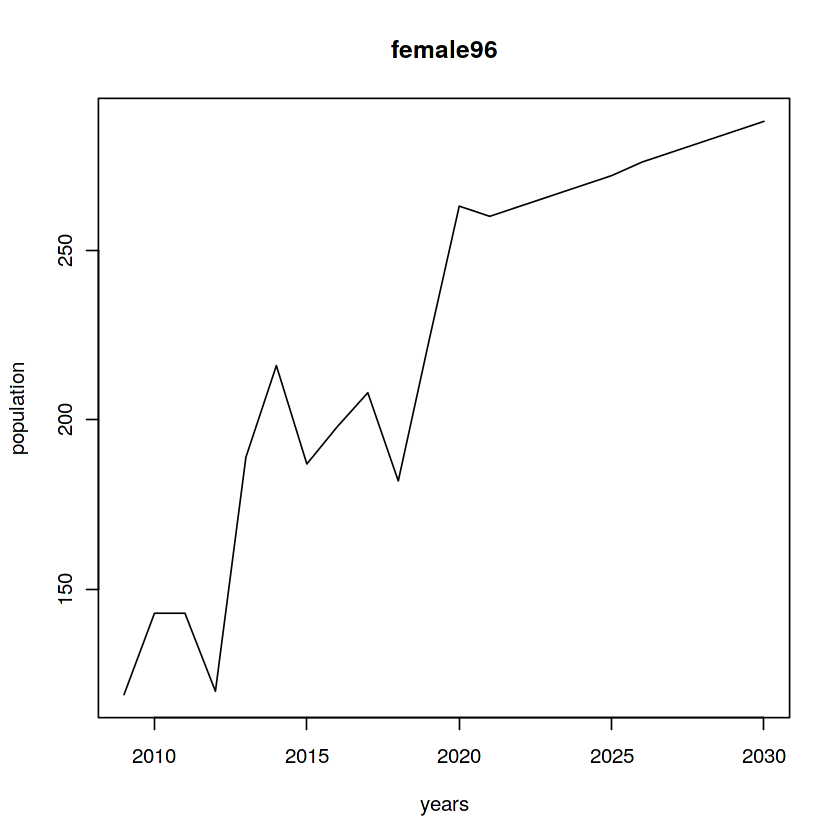

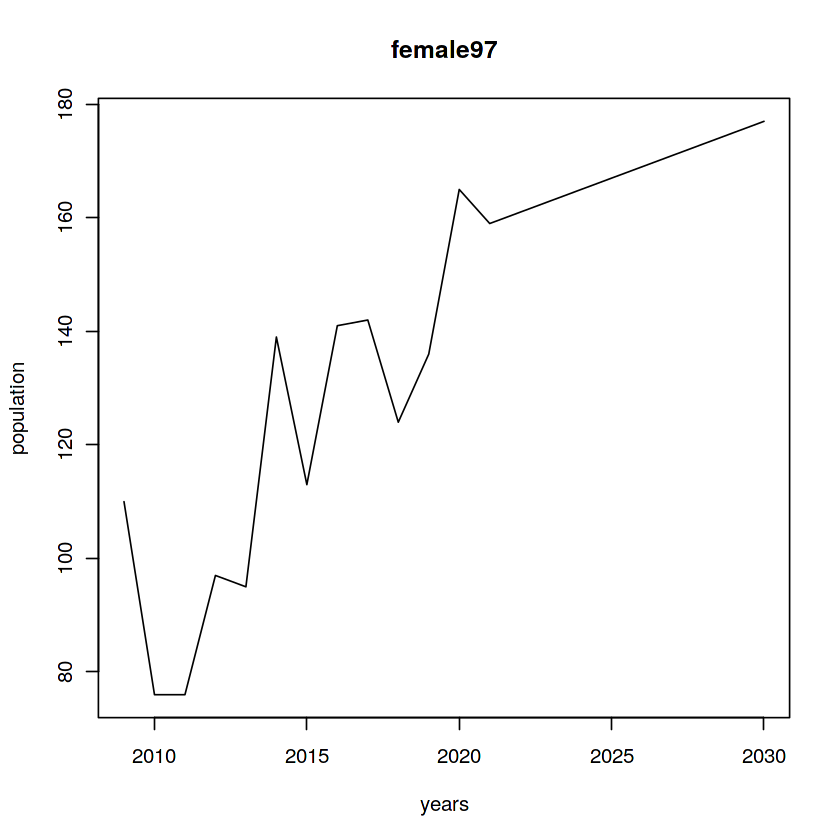

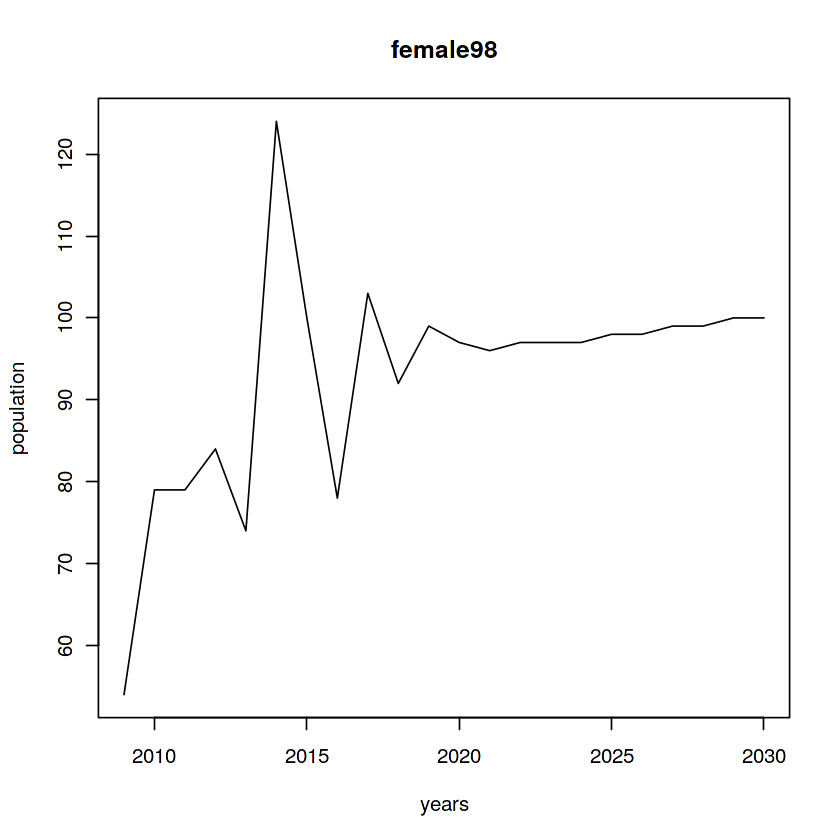

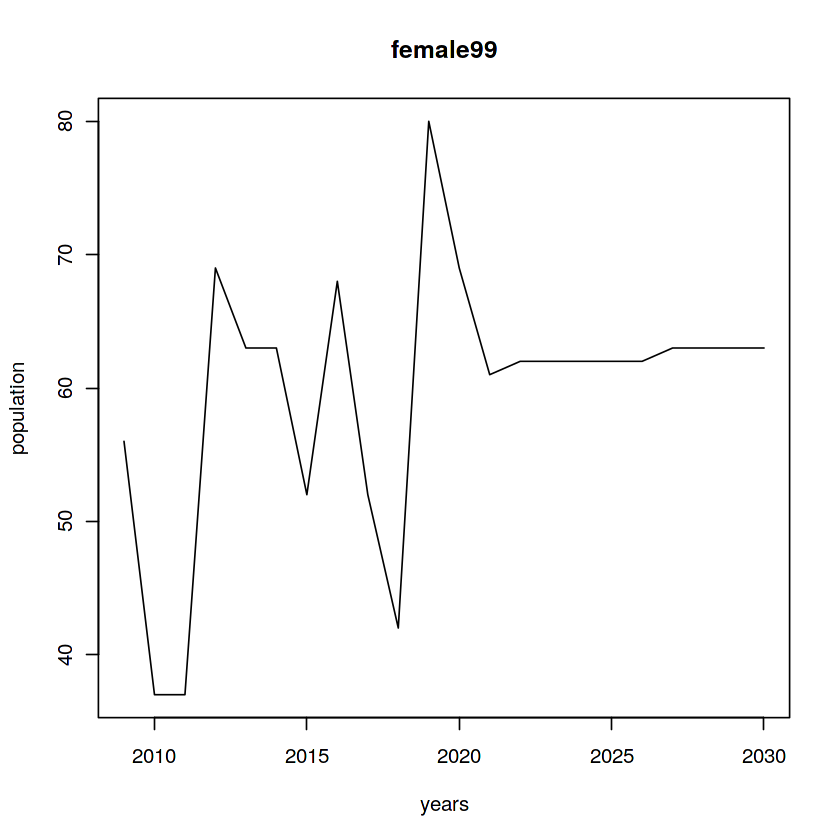

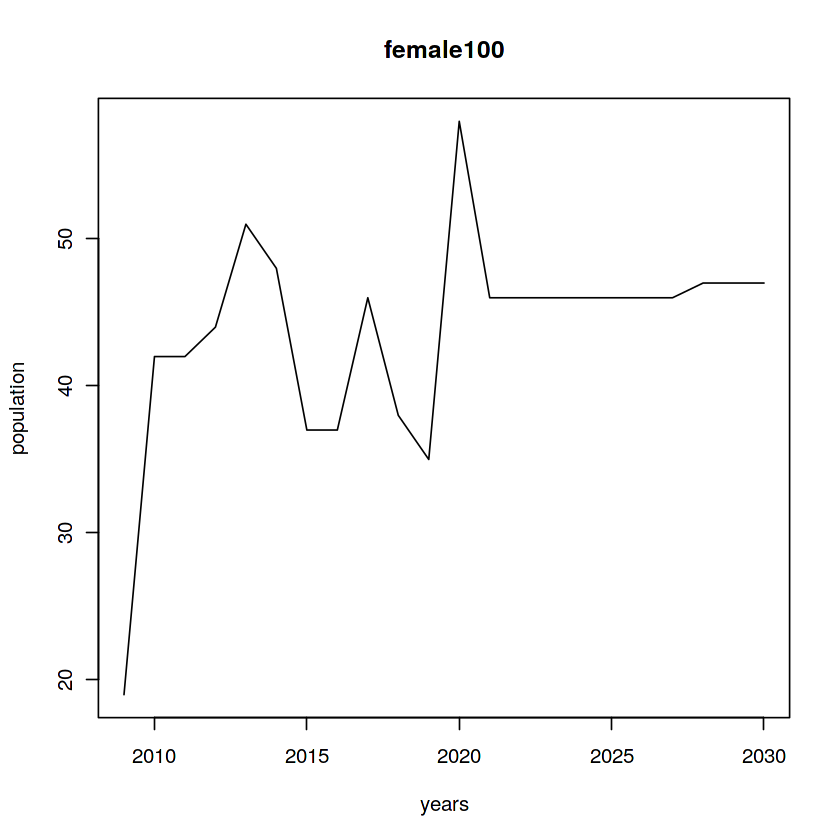

In [8]:
#Графики прогнозов населения до 2030
for( i in 1:100){
  plot( seq(2009,2030) , table[i,seq(2,ncol(table),2)] ,type = "l", main = paste0("male",i),xlab = "years",ylab = "population")
}

for( i in 1:100){
  plot( seq(2009,2030) , table[i,seq(3,ncol(table),2)] ,type = "l", main = paste0("female",i),xlab = "years",ylab = "population")
}


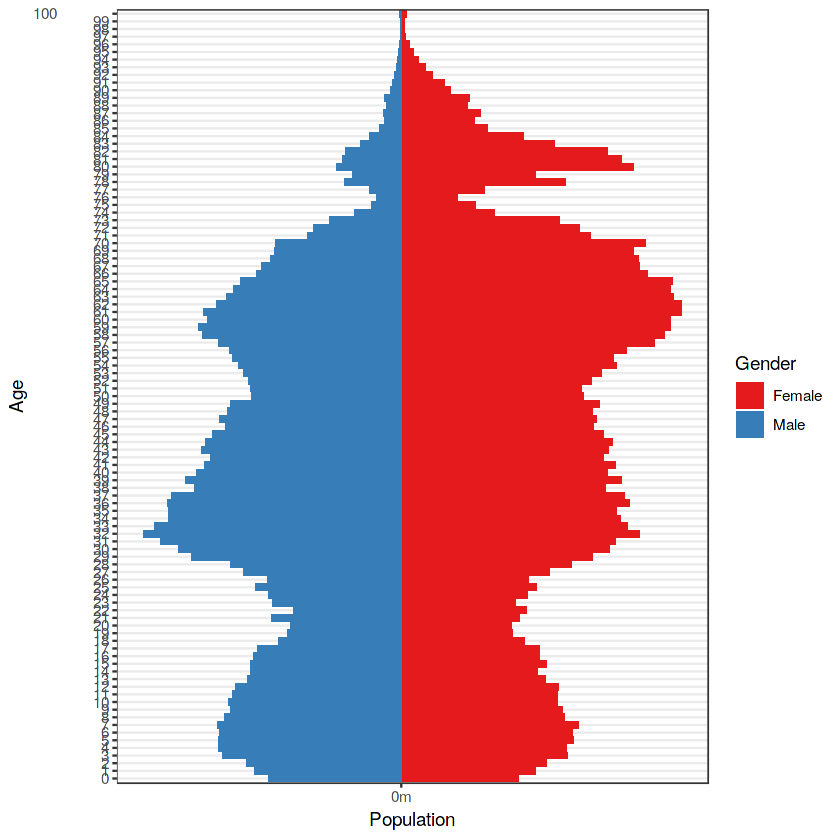

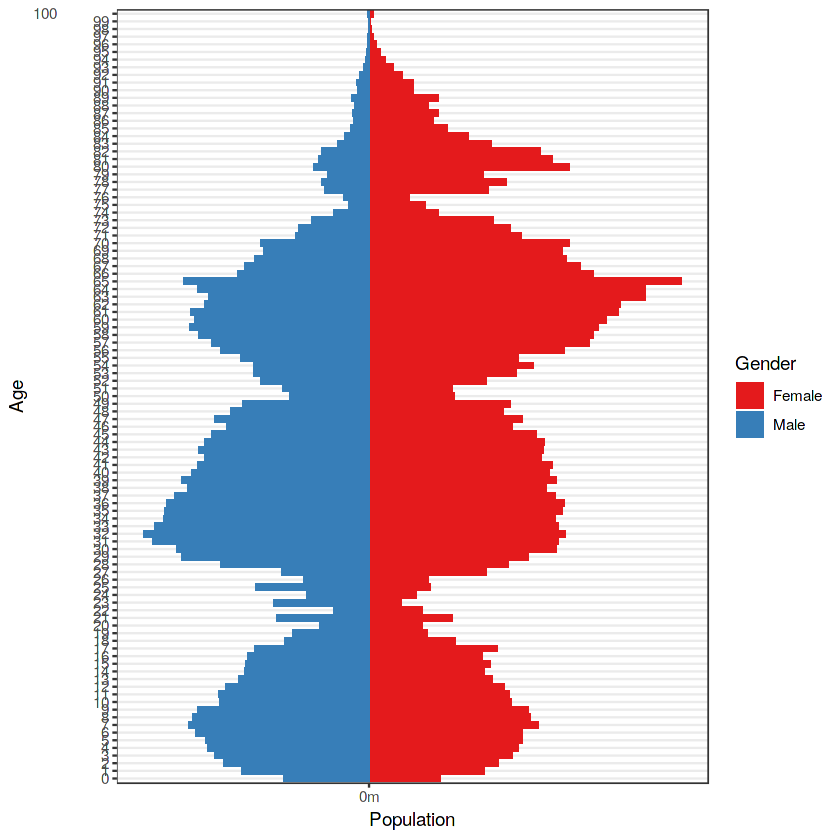

In [9]:
#Поло-возрастная таблица
get_data <- function(i) {
  keep <- c(1, i, i+1)
  df <- table[,keep]  
  names(df) <- c("Age", "Male", "Female")
  cols <- 2:3
  df[,cols] <- apply(df[,cols], 2, function(x) as.numeric(as.character(gsub(",", "", x))))
  df <- df[df$Age != 'Total', ]  
  df$Male <- -1 * df$Male
  df$Age <- factor(df$Age, levels = df$Age, labels = df$Age)
  df.melt <- melt(df, 
                  value.name='Population', 
                  variable.name = 'Gender', 
                  id.vars='Age' )
  
  return(df.melt)
}
nov  <- get_data(24);
ggplot(nov, aes(x = Age, y = Population, fill = Gender)) + 
geom_bar(data  = subset(nov,Gender == "Female"), stat = "identity") + 
geom_bar(data = subset(nov,Gender == "Male"), stat = "identity") + 
scale_y_continuous(breaks = seq(-150000000, 150000000, 50000000), 
labels = paste0(as.character(c(seq(15, 0, -5), seq(5, 15, 5))), "m")) + 
coord_flip() + 
scale_fill_brewer(palette = "Set1") + 
theme_bw()
                     
nov  <- get_data(ncol(table) - 1);
ggplot(nov, aes(x = Age, y = Population, fill = Gender)) + 
geom_bar(data  = subset(nov,Gender == "Female"), stat = "identity") + 
geom_bar(data = subset(nov,Gender == "Male"), stat = "identity") + 
scale_y_continuous(breaks = seq(-150000000, 150000000, 50000000), 
labels = paste0(as.character(c(seq(15, 0, -5), seq(5, 15, 5))), "m")) + 
coord_flip() + 
scale_fill_brewer(palette = "Set1") + 
theme_bw()


Выше построена половозрастная диаграмма сначала для 2020 года, затем для 2030.В Спрогнозированная диаграмма не такая плавная как должна, это может быть обсуловлено недостаточным количеством данным для  прогноза. Общее количество спрогнозированного населения ниже , чем сейчас, так как прогноз рождаемости судя по данным падает. 
Для населения 2020 года характерна "волнобразность , с пиками в примерных возратах - 7(внуки -бэби-бумеров),32-35(дети бэби-бумеров),62-65(бэби-бумеры).Наименьшие значения населения наблюдаются для возрастов 20 (дети конца 90-х), и у старшего поколения(тяжелые после-военные годы).Для нашего демографического проноза "волнообразность" становится еще более ярко выражена с пиками в примерных возрастах 10,35-40, 60-65, а также 80-84. Также сохранится тенденция преобладания женщин старого возраста на мужчинами несмотрят на то, что их рождаемость находится примерно на том же уровне, а число мужчин молодого возраста даже больше

Fitting the auto.arima model

Fitting the ets model

Fitting the thetam model

Fitting the tbats model

Fitting the snaive model

Warning message:
“Removed 1 row(s) containing missing values (geom_path).”


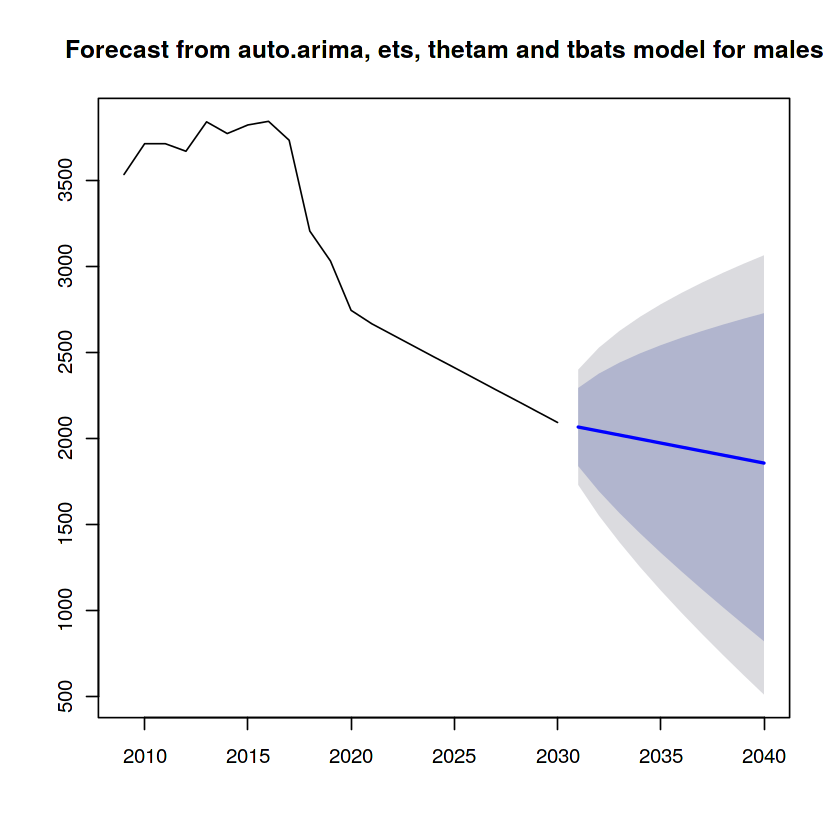

Fitting the auto.arima model

Fitting the ets model

Fitting the thetam model

Fitting the tbats model

Fitting the snaive model



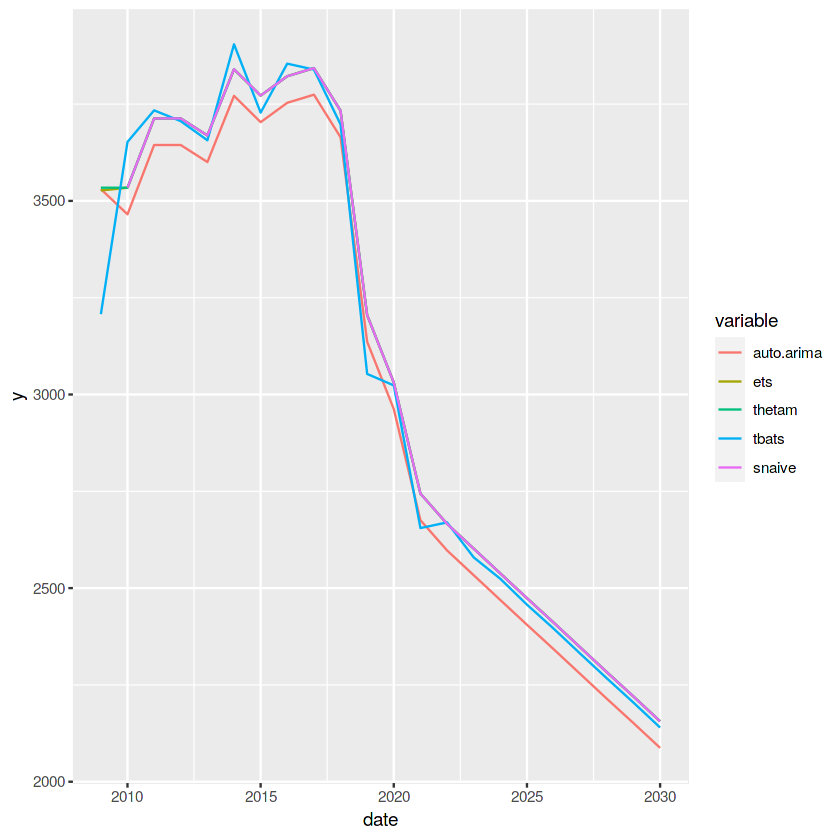

Warning message:
“Removed 1 row(s) containing missing values (geom_path).”


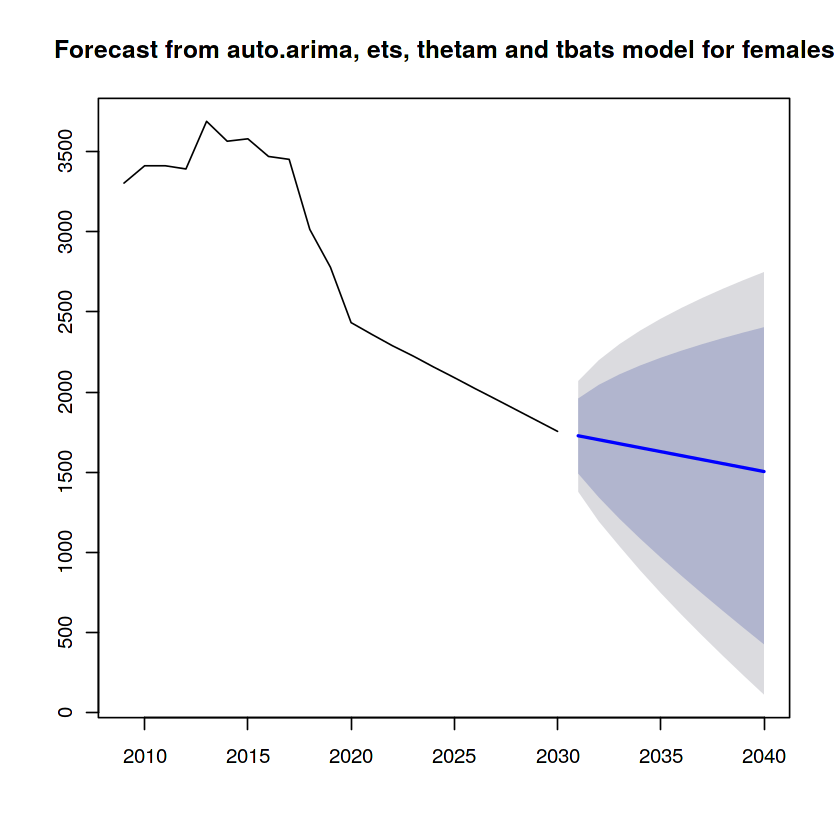

null device 
          1

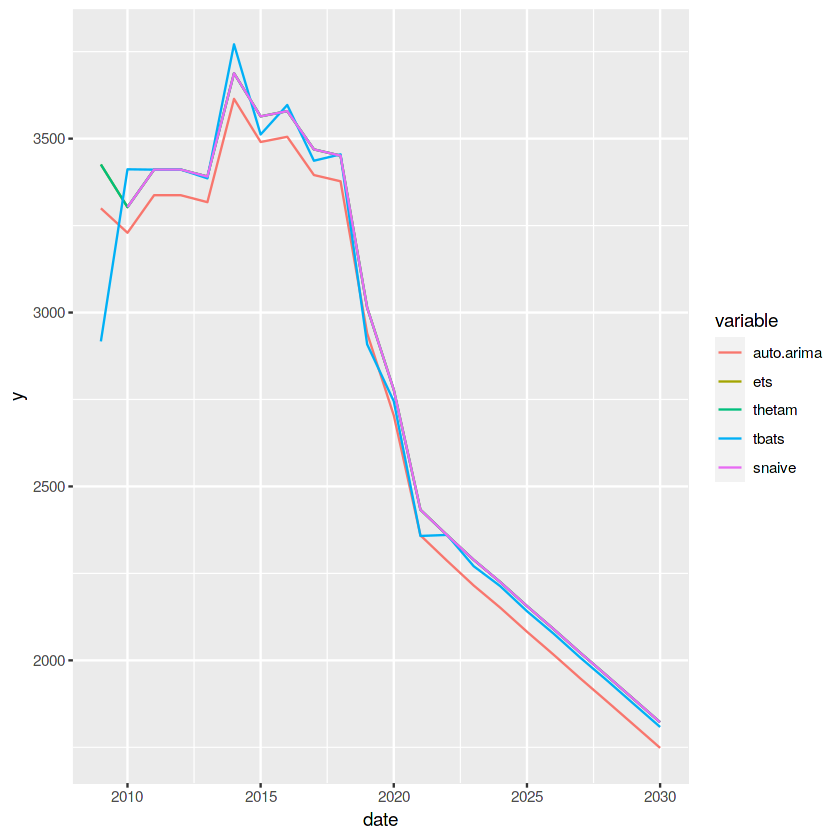

In [10]:
h <- ts(t(table[1,seq(2,ncol(table),2)]),
        frequency = 1,
        start = 2009);
#ggtsdisplay(h)
quickModel <- hybridModel(h,models = c("a","e","f","z","t") );
qq <- forecast(quickModel)
plot(qq, main = "Forecast from auto.arima, ets, thetam and tbats model for males")
plot(quickModel, type = "fit", ggplot = TRUE)
h <- ts(t(table[1,seq(3,ncol(table),2)]),
        frequency = 1,
        start = 2009);
#ggtsdisplay(h)
quickModel <- hybridModel(h,models = c("a","e","f","z","t") );
qq <- forecast(quickModel)
plot(qq, main = "Forecast from auto.arima, ets, thetam and tbats model for females")
plot(quickModel, type = "fit", ggplot = TRUE)
dev.off()

Выше представлены графики прогнозов рождаемости девочек и мальчиков. Сначала идет общих прогноз далее идет прогноз различных моделей. Видно, что все модели дали примерно одинаковый прогноз рождаемости, обусловленный однозначным спадом рождаеомсти последние несколько лет.

# Задание 2
Построение прогноза занятости населения на основе демографического прогноза

В основу построения проноза занятости мы взяли наш демографический прогноз населения до 2030 года, а также данные средней занятости населения по полу и возрастным группам за 2017-2019 года. Количество занятых для каждой возрастной группы расчитывается как количество человек в данной возрастной группе, умноженный на коэфицент занятости. Коэфицент занятости рассчитывается : Для известных годов (2017-2019) как соотношение работающих людей к общему населению, для неизветсных(прогнозируемых годов) как среднее арифметическое коэфицентов занятости для трех предыдущих годов( те примерные средние значения для текущей возрастной группы)

Так как данные представленые на сайте со статистикой находятся в формате долей занятых от общего числа, сначала мы высчитываем коэфиценты занятости для изветсных годов

In [11]:

table1<- data.frame(a = c("15-19","20-24","25-29","30-34","35-39","40-44","45-49","50-54","55-59","60-69","70-80"),m2017 = c(0.2,5.8,15.1,15,13.6,12,10.1,11.2,10.8,5.9,0.2),f2017 = c(0.2,5,12.1,13.4,12.8,12.6,12.2,13.8,10.4,7.1,0.3),m2018 = c(0.5,5.7,14.3,15.6,13.1,12,10.3,10.8,11.1,6.3,0.4),f2018 = c(0.3,4.5,12,12.8,13.1,13.1,12,13,11.3,6.9,0.8),m2019 = c(0.6,5.1,12.9,15.7,14,12.5,10.7,9.9,11,7.3,0.3),f2019 = c(0.4,3.6,11.3,13.5,13.8,12.9,11.8,12.5,11.3,8.1,0.8))
  nums <- c(1504,1505,1493,1485,1457,1459);
  table2 <- table1
   for( i in 2:ncol(table2)){
     table2[i] <- round(table2[i]*nums[i-1])
   }
  table3 <- table2
 rownames(table) <- 0:100
 groups<-list(15:19,20:24,25:29,30:34,35:39,40:44,45:49,50:54,55:59,60:69,70:80)
 for (i  in 1:length(groups) ){
   table3[i,c("m2017","m2018","m2019")] <- colSums(table[sapply(groups[[i]],toString),c("m2017","m2018","m2019")])
   table3[i,c("f2017","f2018","f2019")] <- colSums(table[sapply(groups[[i]],toString),c("f2017","f2018","f2019")])
 }
 for(i in 1:nrow(table3))
   for(j in 2:ncol(table3)){
     table3[i,j] <- table2[i,j]/table3[i,j]
   }
 for(i in 2020:2030){
       st <- ncol(table3) - 1;
       sf <- ncol(table3) ;
       t <- table3[,st:sf];
       t[1] <- (table3[ncol(table3) - 1]+table3[ncol(table3) - 3]+table3[ncol(table3) - 5])/3;
       t[2] <- (table3[ncol(table3)]+table3[ncol(table3) - 2]+table3[ncol(table3) - 4])/3;
       names(t) = c(paste0("m",i),paste0("f",i));
       table3 <- cbind(table3,t)
 }

Представлены коэфиценты занятости имеющиеся и спрогнозированные. Можно заметить , что для некоторых возрастных групп, например 25-29, коэфицент занятости >1 (чего по сути быть не может). Можно предположить , что данный результат связан с неточностью предоставленных данных , также отсутствия учета некоторых факторов, таких как миграция.

In [12]:
table3

a,m2017,f2017,m2018,f2018,m2019,f2019,m2020,f2020,m2021,⋯,m2026,f2026,m2027,f2027,m2028,f2028,m2029,f2029,m2030,f2030
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
15-19,0.02369332,0.02425659,0.05672141,0.03533793,0.06541427,0.04528887,0.04860967,0.03496113,0.05691511,⋯,0.05530403,0.03831041,0.05568265,0.03851571,0.05556987,0.03848574,0.05551885,0.03843729,0.05559046,0.03847958
20-24,0.63127804,0.55498193,0.66349602,0.52444863,0.57475443,0.41560497,0.62317616,0.49834518,0.62047554,⋯,0.61445855,0.47634626,0.61374617,0.47487462,0.61352749,0.47486620,0.61391074,0.47536236,0.61372813,0.47503439
25-29,0.96976685,0.82735120,1.01594099,0.90186750,1.01391811,0.93718736,0.99987532,0.88880202,1.00991147,⋯,1.00701095,0.90636899,1.00738255,0.90739799,1.00720904,0.90716110,1.00720085,0.90697603,1.00726414,0.90717837
30-34,0.89909134,0.85344901,0.91874088,0.80321149,0.90838694,0.85076239,0.90873972,0.83580763,0.91195585,⋯,0.91028745,0.83515656,0.91033996,0.83525684,0.91025552,0.83549631,0.91029431,0.83530323,0.91029660,0.83535213
35-39,0.94392912,0.87009937,0.87924834,0.86778482,0.90025598,0.89472515,0.90781114,0.87753644,0.89577182,⋯,0.90066588,0.88138807,0.90034755,0.88166806,0.90061092,0.88170675,0.90054145,0.88158763,0.90049997,0.88165415
40-44,0.89683959,0.89292273,0.89121027,0.91316185,0.89771775,0.87352641,0.89525587,0.89320366,0.89472796,⋯,0.89536786,0.89025417,0.89539221,0.88998591,0.89542037,0.88986655,0.89539348,0.89003554,0.89540202,0.88996267
45-49,0.88032454,0.92354509,0.87514227,0.89895576,0.87515437,0.86430042,0.87687373,0.89560042,0.87572346,⋯,0.87603917,0.88619630,0.87599507,0.88560084,0.87601430,0.88565330,0.87601618,0.88581681,0.87600852,0.88569031
50-54,0.90715709,0.88771585,0.92031963,0.88215134,0.86604623,0.87953318,0.89784099,0.88313346,0.89473562,⋯,0.89145351,0.88182468,0.89096200,0.88174805,0.89085252,0.88176576,0.89108934,0.88177950,0.89096795,0.88176444
55-59,0.74206222,0.54146055,0.77993223,0.59725930,0.79605623,0.61793036,0.77268356,0.58555007,0.78289067,⋯,0.78132491,0.59779842,0.78182755,0.59850467,0.78170512,0.59832083,0.78161919,0.59820797,0.78171729,0.59834449


In [13]:
 for(i in 2020:2030){
   st <- ncol(table2) - 1;
   sf <- ncol(table2);
   t <- table2[,st:sf];
   for (j in 1:length(groups)){
      t[j,1] <- sum(table[sapply(groups[[j]],toString),paste0("m",i)]);
      t[j,2] <- sum(table[sapply(groups[[j]],toString),paste0("f",i)]);
      t[j,1] = round(t[j,1]* table3[j,paste0("m",i)]);
      t[j,2] = round(t[j,2]*table3[j,paste0("f",i)]);
   }
   names(t) = c(paste0("m",i),paste0("f",i));
   table2 <- cbind(table2,t)
 }

Таблица количества занятого населения за 2017-2030 года. По прогнозу заности,количество работающих подростнков а также людей преклонного возраста увеличится, в то же время количество работающей молодежи(<30) уменьшится. В нашем случае прогноз занятости напрямую зависит от прогноза населения, соответственно текущие изминения  в занятости можно соотнести с прогнозируемыми изминениями в населении.

In [14]:
table2

a,m2017,f2017,m2018,f2018,m2019,f2019,m2020,f2020,m2021,⋯,m2026,f2026,m2027,f2027,m2028,f2028,m2029,f2029,m2030,f2030
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
15-19,301,301,746,446,874,584,682,474,775,⋯,725,490,724,489,718,485,712,481,708,478
20-24,8723,7525,8510,6682,7431,5252,7868,6123,7489,⋯,6068,4180,5804,3910,5548,3654,5300,3405,5050,3149
25-29,22710,18210,21350,17820,18795,16487,16928,14206,16940,⋯,15810,12919,15554,12681,15315,12424,15085,12169,14849,11919
30-34,22560,20167,23291,19008,22875,19696,22576,19137,22819,⋯,23176,19371,23258,19382,23334,19396,23416,19400,23495,19409
35-39,20454,19264,19558,19454,20398,20134,21009,19812,20645,⋯,21105,20152,21168,20165,21244,20230,21311,20260,21379,20297
40-44,18048,18963,17916,19454,18212,18821,18286,19231,18322,⋯,18459,19235,18485,19241,18513,19251,18538,19267,18563,19279
45-49,15190,18361,15378,17820,15590,17216,16163,18129,16125,⋯,15714,16785,15638,16588,15564,16407,15491,16229,15418,16047
50-54,16845,20769,16124,19305,14424,18238,14360,17678,13941,⋯,12285,14780,11960,14308,11642,13838,11326,13369,11008,12896
55-59,16243,15652,16572,16780,16027,16487,14789,14817,15016,⋯,15012,15060,15017,15038,15009,14994,14999,14950,14993,14913


Прогнозы изменения занятости поло-возрастных групп

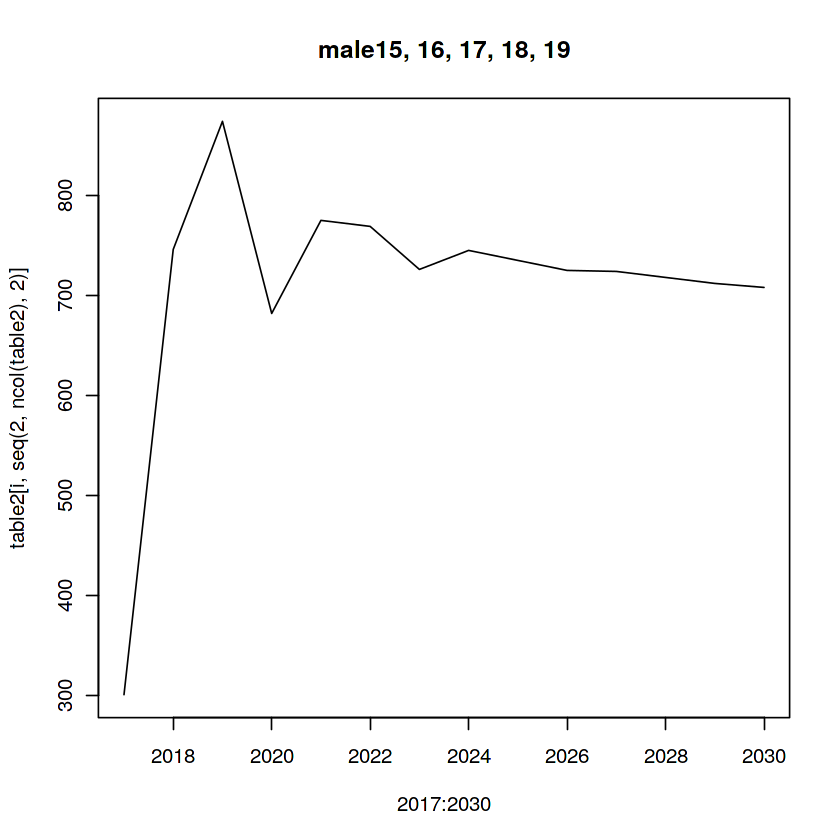

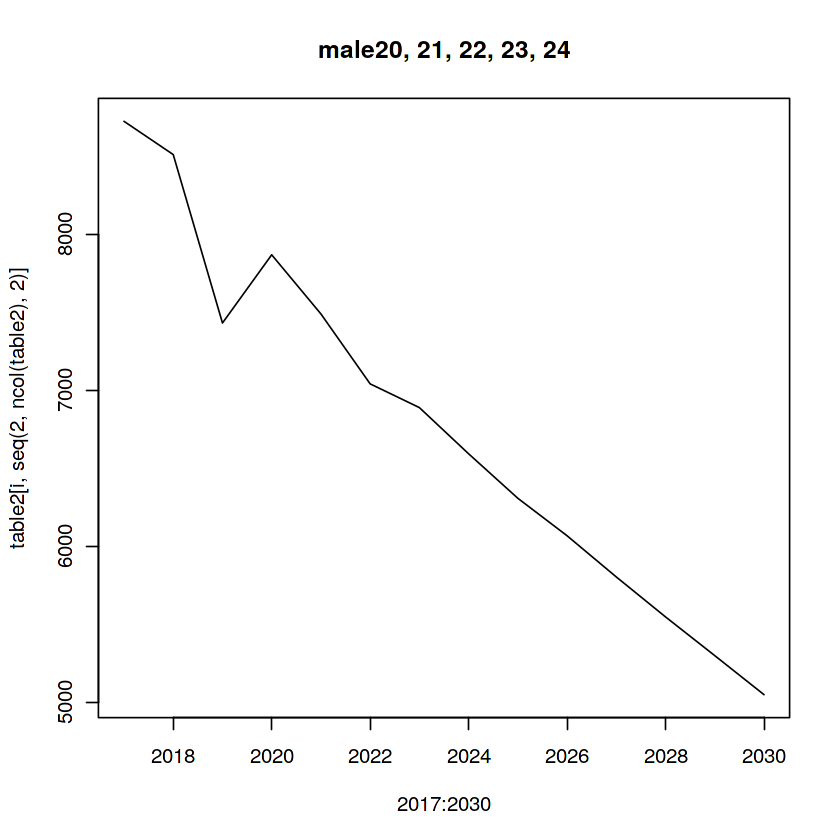

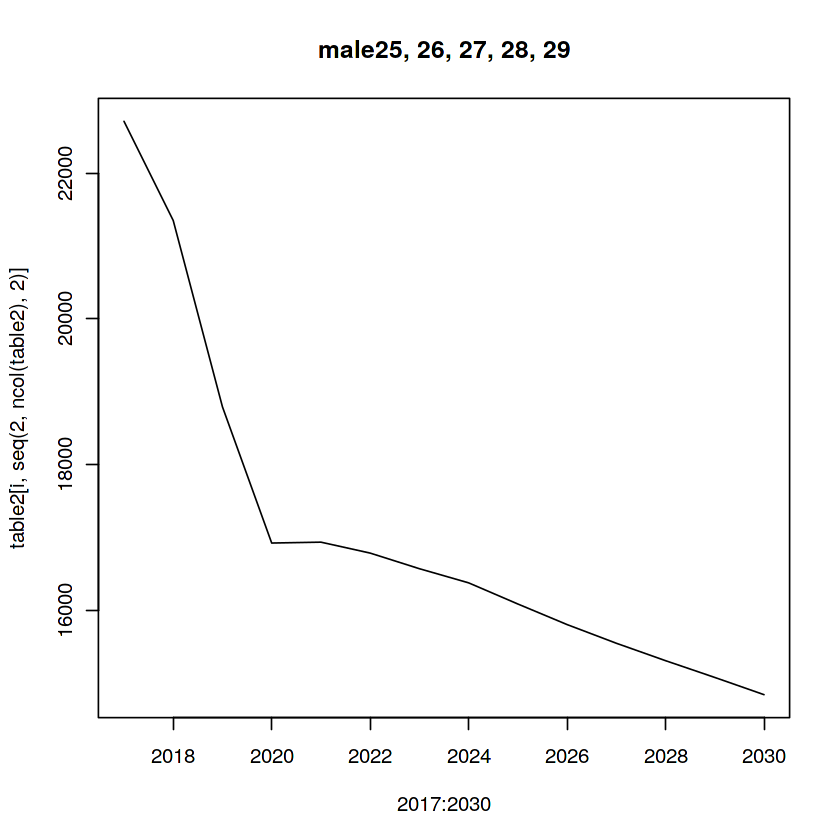

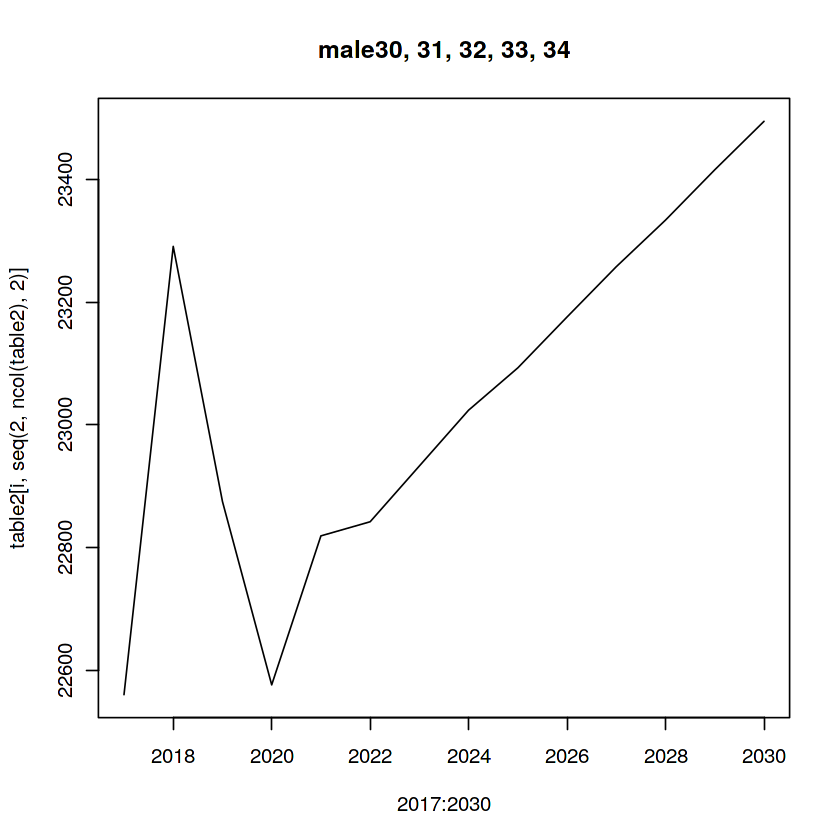

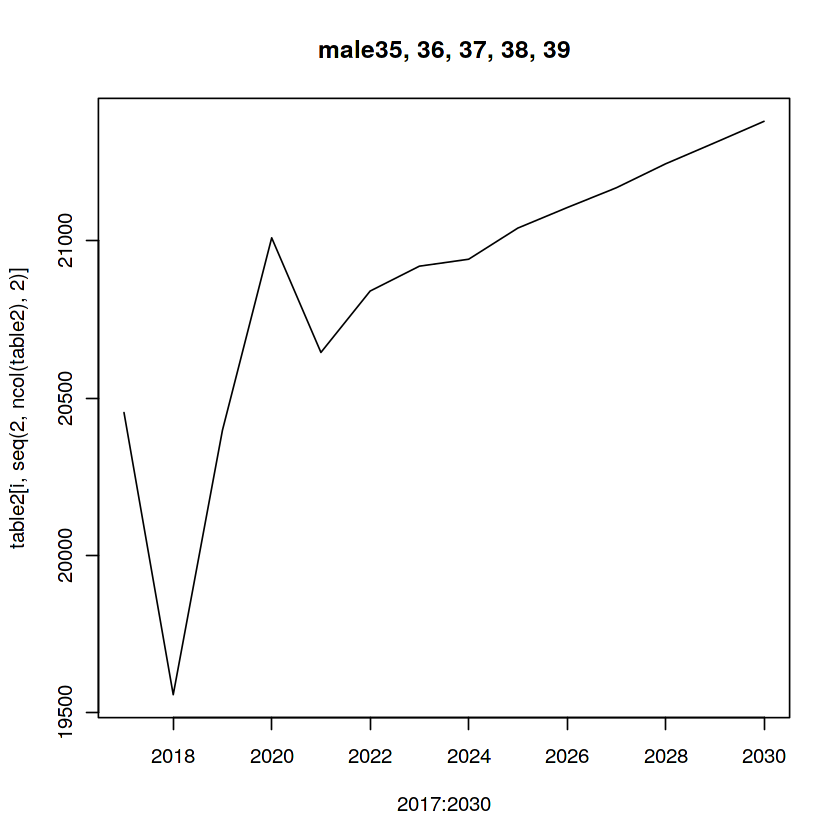

...

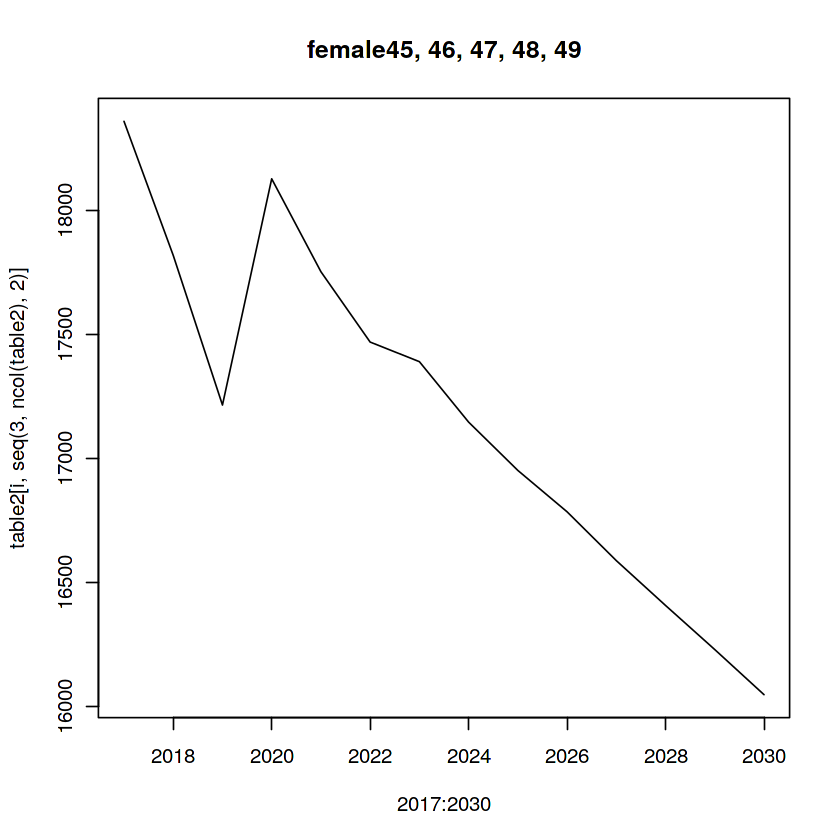

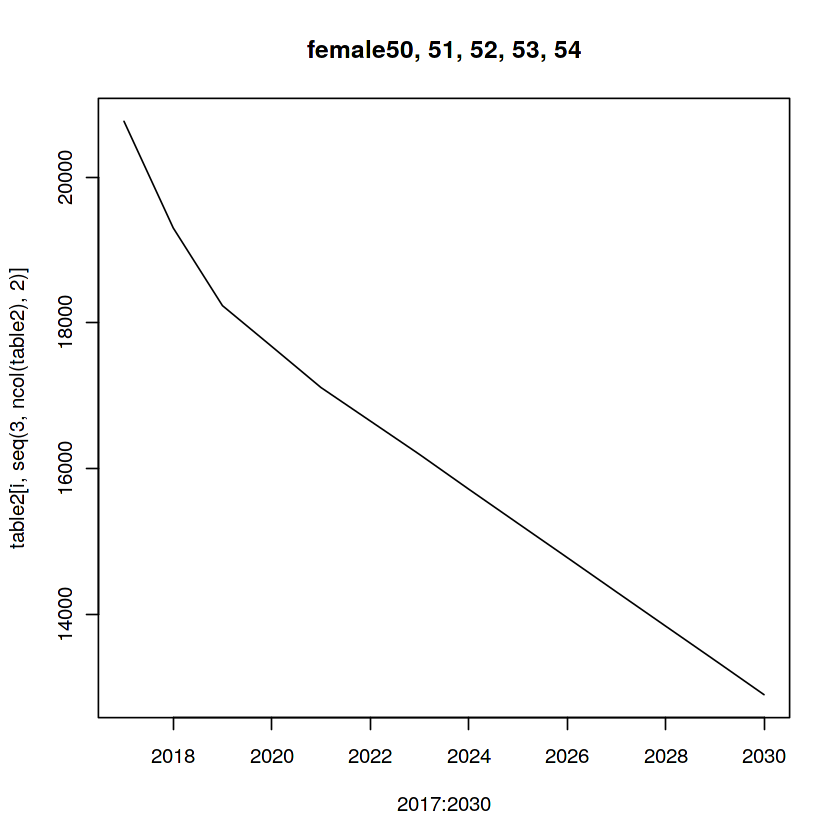

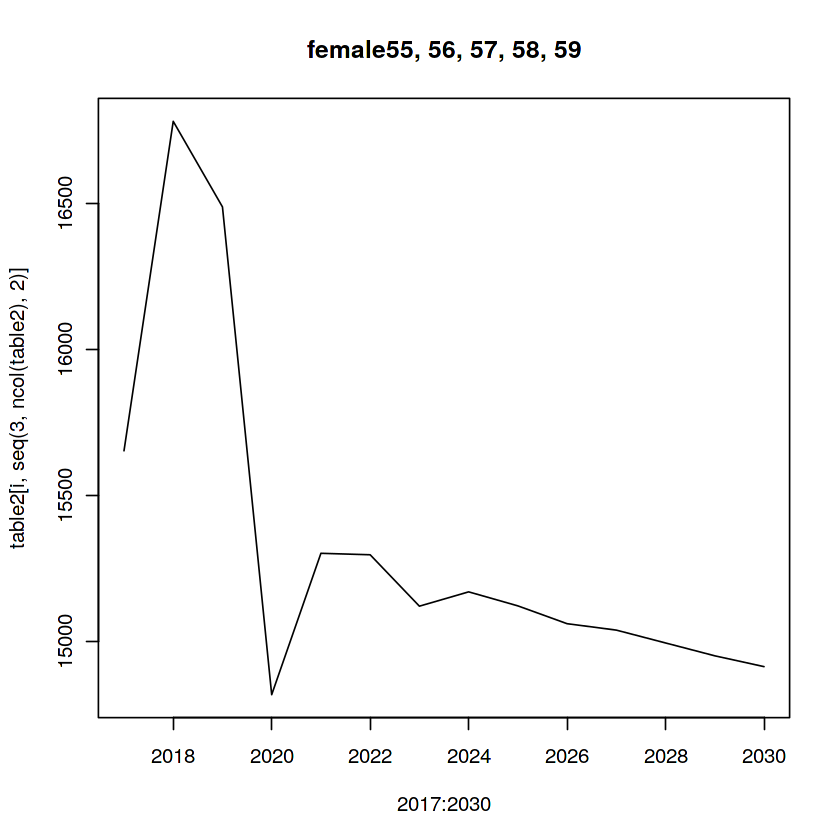

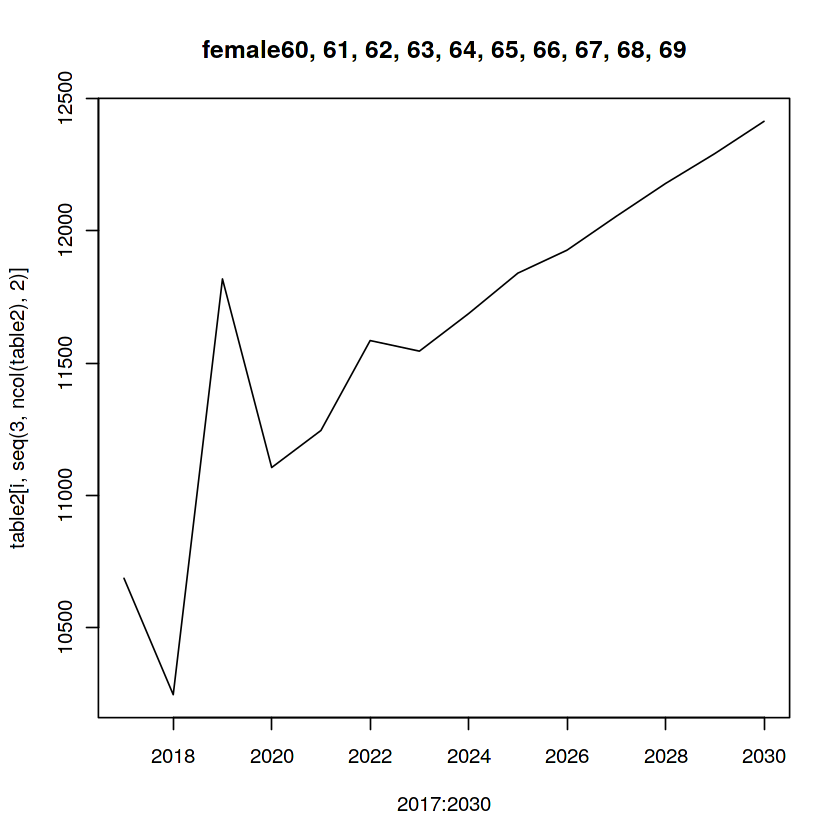

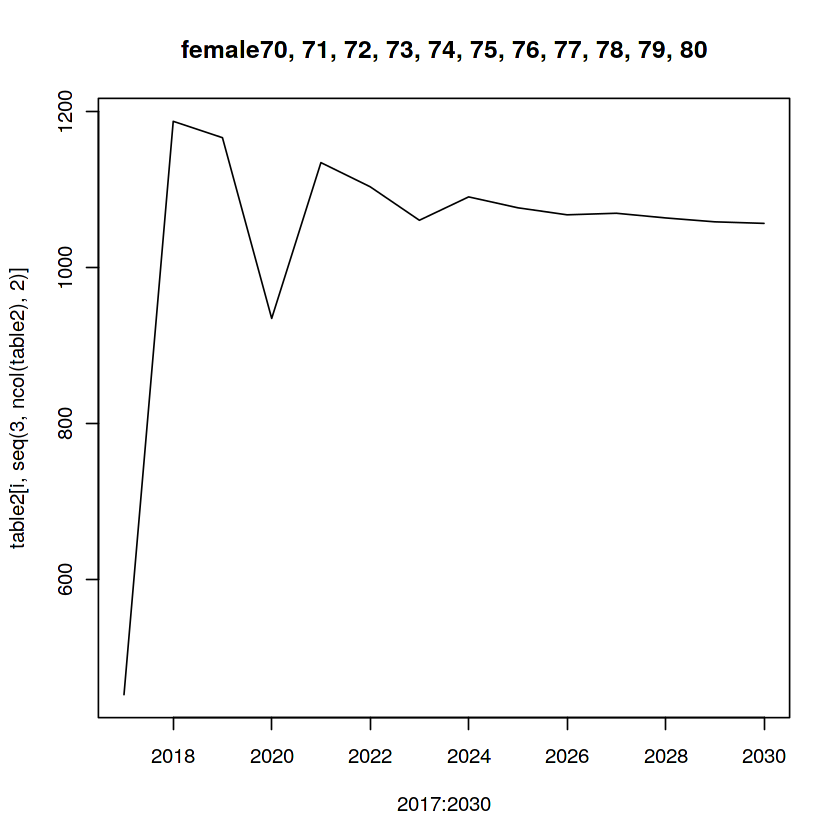

In [16]:
for (i in 1:length(groups)){
    plot(2017:2030,table2[i,seq(2,ncol(table2),2)],type = "l",main = paste0("male",toString(groups[[i]])))
}
for (i in 1:length(groups)){
    plot(2017:2030,table2[i,seq(3,ncol(table2),2)],type = "l",main = paste0("female",toString(groups[[i]])))
}